<a href="https://colab.research.google.com/github/bnv20/cakd3/blob/main/dl_object_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


객체 탐지
- 한 이미지에서 객체와 그 경계 상자를 탐지
- 객체 탐지 알고리즘은 일반적으로 이미지를 입력으로 받고 경계 상자와 객체
클래스 리스트를 출력
- 경계 상자에 대해 그에 대응하는 예측 클래스와 클래스의 신뢰도를 출력

Applications
- 자율 주행 자동차에서 다른 자동차와 보행자를 찾을 때
- 의료 분야에서 방사선 사진을 사용해 종양이나 위험한 조직을 찾을 때
- 제조업에서 조립 로봇이 제품을 조립하거나 수리할 때
- 보안 산업에서 위협을 탐지하거나 사람 수를 셀 때

Bounding Box
- 이미지에서 하나의 객체 전체를 포함하는 가장 작은 직사각형

  <img src="https://miro.medium.com/max/850/1*KL6r494Eyfh3iYEXQA2tzg.png">

  <sub>[이미지 출처] https://medium.com/anolytics/how-bounding-box-annotation-helps-object-detection-in-machine-learning-use-cases-431d93e7b25b</sub>

IOU(Intersection Over Union)
- 실측값(Ground Truth) 과 모델이 예측한 값이 얼마나 겹치는지를 나타내는 지표
IOU = Area of Overlap / Area of Union  
IOU가 높을수록 잘 예측한 모델

  <img src="https://pyimagesearch.com/wp-content/uploads/2016/09/iou_equation.png" width="300">
<br>
  <img src="https://pyimagesearch.com/wp-content/uploads/2016/09/iou_examples.png" width="400">

<br>

- 예시
  <img src="https://www.pyimagesearch.com/wp-content/uploads/2016/09/iou_stop_sign.jpg">

  <sub>[이미지 출처] https://www.pyimagesearch.com/2016/11/07/intersection-over-union-iou-for-object-detection/</sub>



비최댓값 억제(Non-Maximum Suppression, NMS)란 경계 박스 가운데 가장 확실한 경계 박스만 남기고 나머지 경계 박스는 제거하는 기법

NMS 수행 로직 : https://foxtrotin.tistory.com/429
1. Detected된 Object의 Bounding box중 confidence score가 일정 이하인 값(오브젝트가 맞는지 긴가민가한, 정확도가 떨어지는 값)을 제거한다
2. 가장 높은 confidence score를 가진 box순으로 내림차순 정렬하고 모든 box에 순차적으로 아래 로직 적용
 - 높은 confidence score를 가진 box와 겹치는 다른 box를 모두 조사하여 IOU가 특정 threshold 이상인 box를 모두 제거(예: IOU Threshold>0.4) 
 - 해당 박스와 겹치는 다른 box들을 보면서 각각의 IOU를 계산, IOU가 높을 수록 제거 ->즉, 중복을 제거하는 과정이다
3. 남아 있는 box만 선택한다

Confidence score가 높을 수록, IOU Threshold가 낮을 수록 많은 Box가 제거된다.
이런 방법을 쓰면 단지 중복 제거 뿐만 아니라 그 오브젝트와 관련된 최소한의 박스를 남길 수 있기 때문에 더 정확도를 높힐 수 있다

mAP 정리, Precision과 Recall의 이해 : https://lapina.tistory.com/98
- AP (Average Precision) : Recall value [0.0, 0.1, …, 1.0] 값들에 대응하는 Precision 값들의 Average 이다.
- mAP (mean Average Precision) : 1개의 object당 1개의 AP 값을 구하고, 여러 object-detector 에 대해서 mean 값을 구한 것이 mAP 이다.
- 즉 mAP란 mutiple object detection 알고리즘에 대한 성능을 1개의 scalar value로 표현한 것이다.

mAP를 구하는 순서
1. Precision - Recall 곡선을 그린다.
2. Threshold를 0으로 정해 놓고 detection 알고리즘을 모든 test 이미지에 돌린다.
3. Bounding-box에 해당하는 confidence score와 true positive/false positive 여부를 결정한다.
4. Pair를 confidence 레벨값에 따라 내림차순으로 정렬한다.
5. Interpolated Precision-recall 값을 구한다.
6. AP를 구한다.
7. mAP를 구한다.

mAP@0.5 vs mAP@0.5-0.95
- IOU를 0.5로 설정하여 모델 성능을 평가할 경우 원래 Ground true Box와 절반 이상만 겹치는 예측을 하면 맞는 걸로 평가합니다. 즉 절반만 겹치던, 완전히 동일하게 겹치던 모두 다 맞는 걸로 인정하기 때문에 상대적으로 성능이 떨어지는 모델의 평가가 제대로 평가되지 않을 수 있다.
- 예전에 Pascal VOC Contest할 때는 이 정도 수준에서 맞는 걸로 평가했습니다만, Coco Contest에서는 평가 기준을 바꿔 버린다.
- IOU가 0.5 부터 시작해서 보다 엄격한 기준을 적용해 가면서 평가한다.
- IOU가 0.95 정도 되면 거의 Ground Trueth Box와 거의 동일한 수준으로 예측해야 합니다. 이 경우는 상대적으로 IOU가 0.5 일때 보다 모델 성능 평가가 떨어지게 된다.
- 이처럼 IOU를 0.5 부터 조금씩 증가 시켜서 모델 성능 평가를 하는 방식으로 보다 엄격한 모델 성능 평가가 가능

NMS(Non-Maximum Suppression, 비최댓값 억제)
- 확률이 가장 높은 상자와 겹치는 상자들을 제거하는 과정
- 최댓값을 갖지 않는 상자들을 제거 과정
 - 확률 기준으로 모든 상자를 정렬하고 먼저 가장 확률이 높은 상자를 취함
 - 각 상자에 대해 다른 모든 상자와의 IOU를 계산
 - 특정 임곗값을 넘는 상자는 제거

  <img src="https://pyimagesearch.com/wp-content/uploads/2014/10/nms_fast_03.jpg">

  <sub>[이미지 출처] https://www.pyimagesearch.com/2015/02/16/faster-non-maximum-suppression-python/</sub>

### VOC

- 2005년부터 2012년까지 진행

- Object Detection 기술의 benchmark로 간주

- 데이터셋에는 20개의 클래스가 존재

- 훈련 및 검증 데이터 : 11,530개

- ROI에 대한 27,450개의 Annotation이 존재

- 이미지당 2.4개의 객체 존재

  <img src="https://paperswithcode.github.io/sotabench-eval/img/pascalvoc2012.png">

  <sub>[이미지 출처] https://paperswithcode.github.io/sotabench-eval/pascalvoc/</sub>

COCO Dataset
- Common Objects in Context
- 200000개의 이미지
- 80개의 카테고리에 500000개 이상의 객체 Annotation이 존재

https://cocodataset.org/

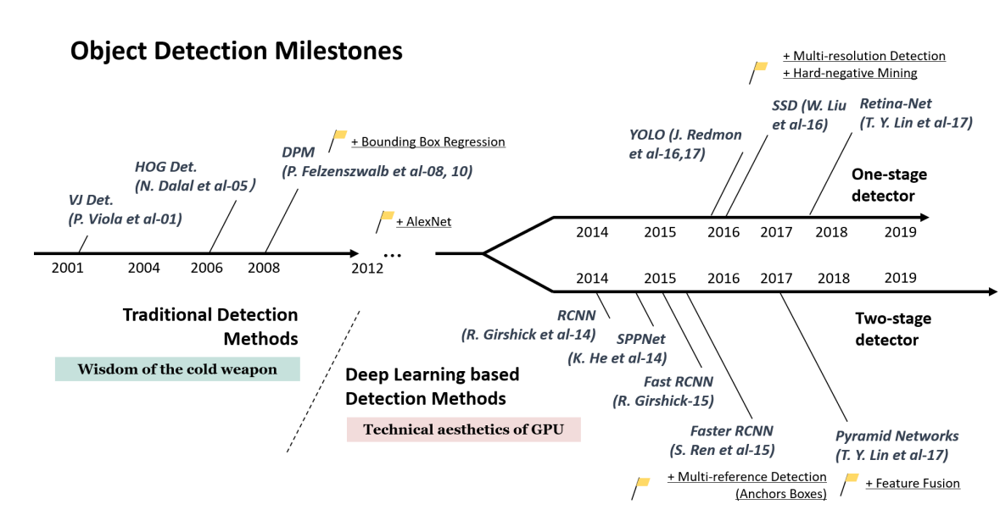


* RCNN (2013)
  - Rich feature hierarchies for accurate object detection and semantic segmentation (https://arxiv.org/abs/1311.2524)
  - 물체 검출에 사용된 기존 방식인 sliding window는 background를 검출하는 소요되는 시간이 많았는데, 이를 개선시킨 기법으로 Region Proposal 방식 제안
  - 매우 높은 Detection이 가능하지만, 복잡한 아키텍처 및 학습 프로세스로 인해 Detection 시간이 매우 오래 걸림

* SPP Net (2014)
  - Spatial Pyramid Pooling in Deep Convolutional Networks for Visual Recognition (https://arxiv.org/abs/1406.4729)
  - RCNN의 문제를 Selective search로 해결하려 했지만, bounding box의 크기가 제각각인 문제가 있어서 FC Input에 고정된 사이즈로 제공하기 위한 방법 제안
  - SPP은 RCNN에서 conv layer와 fc layer사이에 위치하여 서로 다른 feature map에 투영된 이미지를 고정된 값으로 풀링
  - SPP를 이용해 RCNN에 비해 실행시간을 매우 단축시킴

* Fast RCNN (2015)
  - Fast R-CNN (https://arxiv.org/abs/1504.08083)
  - SPP layer를 ROI pooling으로 바꿔서 7x7 layer 1개로 해결
  - SVM을 softmax로 대체하여 Classification 과 Regression Loss를 함께 반영한 Multi task Loss 사용
  - ROI Pooling을 이용해 SPP보다 간단하고, RCNN에 비해 수행시간을 많이 줄임

* Fater RCNN(2015)
  - Faster R-CNN: Towards Real-Time Object Detection with Region Proposal Networks (https://arxiv.org/abs/1506.01497)
  - RPN(Region proposal network) + Fast RCNN 방식
  - Selective Search를 대체하기 위한 Region Proposal Network구현
  - RPN도 학습시켜서 전체를 end-to-end로 학습 가능 (GPU사용 가능)
  - Region Proposal를 위해 Object가 있는지 없는지의 후보 Box인 Anchor Box 개념 사용
  - Anchor Box를 도입해 FastRCNN에 비해 정확도를 높이고 속도를 향상시킴

* SSD (2015)
  - SSD: Single Shot MultiBox Detector (https://arxiv.org/abs/1512.02325)
  - Faster-RCNN은 region proposal과 anchor box를 이용한 검출의 2단계를 걸치는 과정에서 시간이 필요해 real-time(20~30 fps)으로는 어려움
  - SSD는 Feature map의 size를 조정하고, 동시에 앵커박스를 같이 적용함으로써 1 shot으로 물체 검출이 가능
  - real-time으로 사용할 정도의 성능을 갖춤 (30~40 fps)
  - 작은 이미지의 경우에 잘 인식하지 못하는 경우가 생겨서 data augmentation을 통해 mAP를 63에서 74로 비약적으로 높임
  
* RetinaNet (2017)
  - Focal Loss for Dense Object Detection (https://arxiv.org/abs/1708.02002)
  - RetinaNet이전에는 1-shot detection과 2-shot detection의 차이가 극명하게 나뉘어 속도를 선택하면 정확도를 trade-off 할 수 밖에 없는 상황
  - RetinaNet은 Focal Loss라는 개념의 도입과 FPN 덕분에 기존 모델들보다 정확도도 높고 속도도 여타 1-shot detector와 비견되는 모델
  - Detection에선 검출하고 싶은 물체와 (foreground object) 검출할 필요가 없는 배경 물체들이 있는데 (background object) 배경 물체의 숫자가 매우 많을 경우 배경 Loss를 적게 하더라도 숫자에 압도되어 배경의 Loss의 총합을 학습해버림 (예를 들어, 숲을 배경으로 하는 사람을 검출해야하는데 배경의 나무가 100개나 되다보니 사람의 특징이 아닌 나무가 있는 배경을 학습해버림)
  - Focal Loss는 이런 문제를 기존의 crossentropy 함수에서 (1-sig)을 제곱하여 background object의 loss를 현저히 줄여버리는 방법으로 loss를 변동시켜 해결
  - Focal Loss를 통해 검출하고자 하는 물체와 관련이 없는 background object들은 학습에 영향을 주지 않게 되고, 학습의 다양성이 더 넓어짐 (작은 물체, 큰 물체에 구애받지 않고 검출할 수 있게됨)
  - 실제로 RetinaNet은 object proposal을 2000개나 실시하여 이를 확인

* Mask R-CNN (2018)
  - Mask R-CNN (https://arxiv.org/pdf/1703.06870.pdf)

* YOLO (2018)
  - YOLOv3: An Incremental Improvement (https://arxiv.org/abs/1804.02767)
  - YOLO는 v1, v2, v3의 순서로 발전하였는데, v1은 정확도가 너무 낮은 문제가 있었고 이 문제는 v2까지 이어짐
  - 엔지니어링적으로 보완한 v3는 v2보다 살짝 속도는 떨어지더라도 정확도를 대폭 높인 모델
  - RetinaNet과 마찬가지로 FPN을 도입해 정확도를 높임
  - RetinaNet에 비하면 정확도는 4mAP정도 떨어지지만, 속도는 더 빠르다는 장점

* RefineDet (2018)
  - Single-Shot Refinement Neural Network for Object Detection (https://arxiv.org/pdf/1711.06897.pdf)

* M2Det (2019)
  - M2Det: A Single-Shot Object Detector based on Multi-Level Feature Pyramid Network (https://arxiv.org/pdf/1811.04533.pdf)

* EfficientDet (2019)
  - EfficientDet: Scalable and Efficient Object Detection (https://arxiv.org/pdf/1911.09070v1.pdf)


* YOLOv4 (2020)
  - YOLOv4: Optimal Speed and Accuracy of Object Detection (https://arxiv.org/pdf/2004.10934v1.pdf)
  - YOLOv3에 비해 AP, FPS가 각각 10%, 12% 증가
  - YOLOv3와 다른 개발자인 AlexeyBochkousky가 발표
  - v3에서 다양한 딥러닝 기법(WRC, CSP ...) 등을 사용해 성능을 향상시킴
  - CSPNet 기반의 backbone(CSPDarkNet53)을 설계하여 사용
  - Backbone은 이미지로부터 Feature map을 추출하는 부분으로, CSP-Darknet를 사용합니다. YOLO v4의 백본과 유사합니다. YOLO v3의 Backbone은 Darknet53으로 CSP가 적용되지 않습니다. 특이하게도 YOLO v5의 backbone은 종류가 4가지나 됩니다. 제일 작고 가벼운 yolo v5-s부터 m, l, x 까지 포함해서 총 4가지 버전이 있습니다
  - Head는 추출된 Feature map을 바탕으로 물체의 위치를 찾는 부분입니다. 흔히 말하는 Anchor Box(Default Box)를 처음에 설정하고 이를 이용하여 최종적인 Bounding Box를 생성합니다. YOLO v3와 동일하게 3가지의 scale에서 바운딩 박스를 생성합니다. (8 pixel 정보를 가진 작은 물체, 16 pixel 정보를 가진 중간 물체, 32 pixel 정보를 가진 큰 물체를 인식 가능) 또한 각 스케일에서 3개의 앵커 박스를 사용합니다. 그러므로 총 9개의 앵커 박스가 있습니다.

* YOLOv5 (2020)
  - YOLOv4에 비해 낮은 용량과 빠른 속도 (성능은 비슷)
  - YOLOv4와 같은 CSPNet 기반의 backbone을 설계하여 사용
  - YOLOv3를 PyTorch로 implementation한 GlennJocher가 발표
  - Darknet이 아닌 PyTorch 구현이기 때문에, 이전 버전들과 다르다고 할 수 있음

* 이후
  - 수 많은 YOLO 버전들이 탄생
  - Object Detection 분야의 논문들이 계속해서 나오고 있음

YOLO(You Only Look Once)
- 가장 빠른 객체 검출 알고리즘 중 하나
- 256x256 사이즈의 이미지
- 파이썬, 텐서플로 기반 프레임워크가 아닌 C++로 구현된 코드 기준 GPU 사용 시, 초당 170 프레임(170 FPS, frames per second)
- 작은 크기의 물체를 탐지하는데는 어려움

https://pjreddie.com/darknet/yolo/

## YOLO 아키텍처

- 백본 모델(backbone model) 기반
- 특징 추출기(Feature Extractor)라고도 불림
- YOLO는 자체 맞춤 아키텍쳐 사용

  <img src="https://user-images.githubusercontent.com/26322627/70716343-8e857200-1d2f-11ea-8e60-9c75f24ca9ce.png">





## Yolov5

You Only Look Once 의 약자로 Object detection 분야에서 많이 알려진 모델이다.

처음으로 one-stage-detection 방법을 고안하여 실시간으로 Object Detection이 가능하게 만들었다.

#### Yolov5 특징
1. 이미지 전체를 한번만 보는 것

R-CNN: 이미지를 여러장으로 분할하고 CNN 모델을 이용하여 이미지를 분석했다. 따라서 이미지 한장을 보더라도 여러장의 이미지를 분석하는 것과 같았다. 하지만 YOLO는 이러한 과정없이 이미지를 한 번만 보는 특징을 가지고 있다.

### Object Detection의 구조와 종류 : https://ssong915.tistory.com/43

- 백본(Backbone)은 입력이미지를 feature map으로 변형시켜주는 부분이다.

- 헤드(Head)는 Backbone에서 추출한 feature map의 location 작업을 해주는 부분으로, predict classes 와 bounding boxes 작업이 수행된다. 헤드는 크게 Dense Prediction과 Sparse Prediction으로 나누어진다.

- Sparse Prediction을 사용하는 Two-Stage Detector: Predict Classes 와 Bounding Box Regression 분리 ex) R-CNN, R-FCN 
- Dense Prediction을 사용하는 One-Stage Detector: Predict Classes 와 Bounding Box Regression 통합 ex) YOLO, SSD

- 넥(Neck) 은 Backbone 과 Head를 연결하는 부분으로, feature map을 정제하고 재구성한다.

### 절차
input(이미지) → CNN → FC(Fully Connected) → PT(Prediction Tensor) 를 반복
- 이미지를 S*S의 그리드로 분할 (논문에서는 7*7)
그리드마다 하나의 객체를 예측한다. 미리 설정해 둔 경계를 통해서 객체의 위치와 크기를 파악한다. 여러 객체가 한 셀에 있으면 탐지를 못할 수도 있다. 각 Grid cell 은 조건이 있다.
 - B개의 boundary boxes를 예측하고, 각 box는 하나의 box confidence score을 가지고 있다.
    - 예측된 box 수에 관계 없이 단 하나의 객체만 탐지한다.
    - boundary box는 객체의 위치 (x,y), 객체의 크기 (w,h), box confidence score로 구성된다.
    - box confidence score는 box가 객체를 포함하고 있을 가능성을 반영한다.
 - C개의 conditional class probabilities를 예측한다.
    - 탐지된 객체가 어느 특정 클래스에 속하는 지에 대한 확률
- 이미지 전체를 신경망에 넣고 특징 추출을 통해 예측 텐서(Prediction Tensor) 생성
    - S * S * (B*5 +C)
    - 7x7 grids, 2 boundary boxes, 20 classes = 7* 7 * 30
    - 이제 YOLO는 7730 텐서를 예측하는 CNN 네트워크를 구축해야한다.



- 이미지 분류는 GT가 이미지의 클래스이기 때문에 이미지가 딱 주어졌을 때 이 이미지가 GT의 클래스와 일치하는지 불일치하는지를 비교
- 객체 검출에서는 이미지를 분류하는 문제와 달리 여러 객체들이 존재하는 이미지 내에서 객체가 어디에 위치하는지 바운딩 박스(Bounding box)로 찾고, 찾은 위치에 해당하는 박스 내부의 객체가 실제 GT에 있는 클래스와 일치하는지의 여부를 비교
- 객체 검출은 클래스를 제대로 예측하였는지 부터 판단하여 예측하지 못하면 실패로 간주한다. 클래스를 올바르게 예측하였다면 바운딩 박스의 정확도를 기준으로 정확도를 측정

객체 검출에서는 GT 와 예측 값 간의 교집합과 합집합을 통해 IoU를 측정
- True Positive (TP) : 맞다고 추측하고 실제로 맞음. IOU >= Threshold
- False Positive (FP) : 맞다고 추측하고 실제로는 틀림. IOU < Threshold
- False Negative (FN) : 아니라고 추측하고 실제로는 맞음. Ground Truth를 아예 detect 못함
- True Negative (TN) : 아니라고 추측하고 실제로 아님.
 

여기서 Threshold 는 일반적으로 50%, 75%, 95%로 설정된

https://eehoeskrap.tistory.com/546

## YOLO Backbone

- 백본 모델(backbone model) 기반

- 특징 추출기(Feature Extractor)라고도 불림

- YOLO는 자체 맞춤 아키텍쳐 사용

- 어떤 특징 추출기 아키텍쳐를 사용했는지에 따라 성능 달라짐

  <img src="https://www.researchgate.net/publication/335865923/figure/fig1/AS:804106595758082@1568725360777/Structure-detail-of-YOLOv3It-uses-Darknet-53-as-the-backbone-network-and-uses-three.jpg">

  <sub>[이미지 출처] https://www.researchgate.net/figure/Structure-detail-of-YOLOv3It-uses-Darknet-53-as-the-backbone-network-and-uses-three_fig1_335865923</sub>

- 마지막 계층은 크기가 $w \times h \times D$인 특징 볼륨 출력

- $w \times h $는 그리드의 크기이고, $D$는 특징 볼륨 깊이

## YOLO 계층 출력
- 마지막 계층 출력은 w x h x M 행렬
  - M = B x (C + 5)
    - B : 그리드 셀당 경계 상자 개수
    - C : 클래스 개수
  - 클래스 개수에 5를 더한 이유는 해당 값 만큼의 숫자를 예측해야 함
    - tx, ty는 중심 좌표
    - tw, th는 너비와 높이
    - c는 신뢰도
    - p1,p2,...pC는 클래스 1,2,..C의 객체를 포함할 확률
    - Objectness Score : 바운딩 박스에 객체가 포함될 있을 확률
  <br>

  <img src="https://www.researchgate.net/profile/Thi_Le3/publication/337705605/figure/fig3/AS:831927326089217@1575358339500/Structure-of-one-output-cell-in-YOLO.ppm">

  <sub>[이미지 출처] https://www.researchgate.net/figure/Structure-of-one-output-cell-in-YOLO_fig3_337705605</sub>

## 앵커 박스(Anchor Box)

- YOLOv2에서 도입

- 사전 정의된 상자(prior box)

- 객체에 가장 근접한 앵커 박스를 맞추고 신경망을 사용해 앵커 박스의 크기를 조정하는 과정때문에 $t_x, t_y, t_w, t_h$이 필요

  <img src="https://kr.mathworks.com/help/vision/ug/ssd_detection.png">

  <sub>[이미지 출처] https://kr.mathworks.com/help/vision/ug/getting-started-with-yolo-v2.html</sub>

Theory of object detection

https://velog.io/@qsdcfd/Theory-of-object-detection

In [ ]:
import torch

print("Torch version:{}".format(torch.__version__))
print("cuda version: {}".format(torch.version.cuda))
print("cudnn version:{}".format(torch.backends.cudnn.version()))

Torch version:1.13.0+cu116
cuda version: 11.6
cudnn version:8302


파이토치
- 딥러닝 프레임워크 파이토치
  - 파이토치란 데이터에 대한 딥러닝 분석을 쉽게 할 수 있도록 제공하는 오픈소스 기반 딥러닝 프레임워크이다.
  - Data Science 분야의 개발자로 프로그래밍을 하기 위해서 꼭 사용해야 하는 툴 중 하나가 딥러닝 프레임워크(Deep Learning Frameworks)인데 그중에 하나가 바로 파이토치(PyTorch)인 것이다.
  - 딥러닝 프레임워크를 툴로써 제공하기 때문에 개발자는 보다 손쉽게 프로그래밍을 할 수 있다.
  - 예를 들어 딥러닝 프레임워크는 요리사에게 재료 준비와 손질까지 된 환경을 제공해준다고 볼 수 있다.
  - 파이토치는 파이썬 기반으로 바로 사용할 수 있다는 점에서 개발 과정이 텐서플로우보다 심플하다.

- pytorch tutorials : https://tutorials.pytorch.kr/
- yolov3 pytorch 버전 : https://github.com/ultralytics/yolov3
- yolov5 : https://github.com/ultralytics/yolov5

COCO Dataset을 학습한 YOLO v3(PyTorch)

In [ ]:
!git clone https://github.com/ultralytics/yolov3
%cd yolov3/
%pip install -qr requirements.txt

import yaml
import torch
from IPython.display import Image, clear_output

print(f"Torch:{torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda. is_available() else 'CPU'})")

Cloning into 'yolov3'...
remote: Enumerating objects: 10079, done.
remote: Counting objects: 100% (62/62), done.
remote: Compressing objects: 100% (48/48), done.
remote: Total 10079 (delta 29), reused 33 (delta 14), pack-reused 10017
Receiving objects: 100% (10079/10079), 9.39 MiB | 7.88 MiB/s, done.
Resolving deltas: 100% (6787/6787), done.
/content/yolov3
     |████████████████████████████████| 1.6 MB 42.0 MB/s 
Torch:1.13.0+cu116 (Tesla T4)


In [ ]:
!cat requirements.txt

In [ ]:
!ls data/images

bus.jpg  zidane.jpg


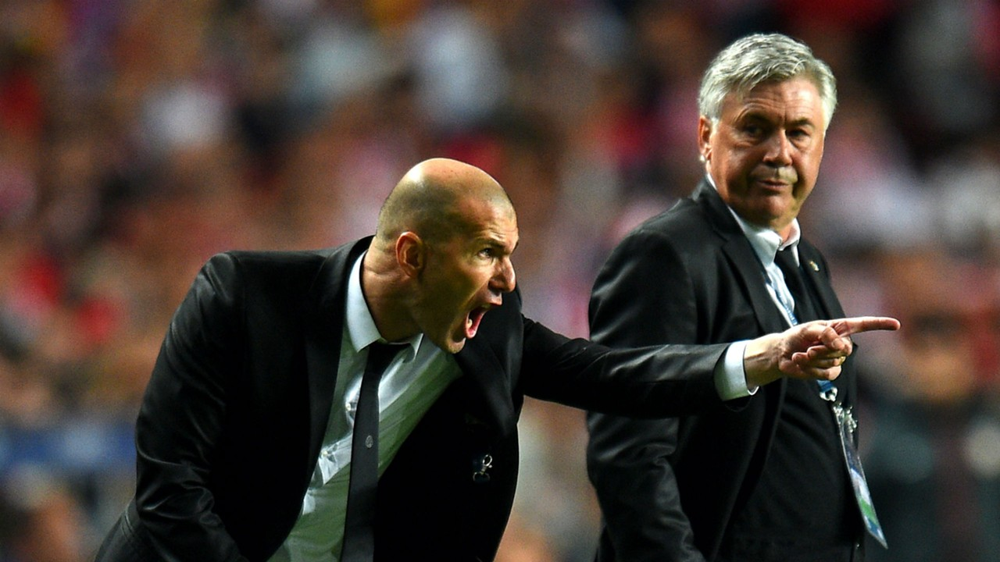

In [ ]:
Image(filename='data/images/zidane.jpg',width=600)

In [ ]:
!pwd

/content/yolov3


In [ ]:
!python detect.py --weights yolov3.pt --img 640 --conf 0.25 --source data/images/

detect: weights=['yolov3.pt'], source=data/images/, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv3 🚀 v9.6.0-31-g91b0406 torch 1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

100% 119M/119M [00:00<00:00, 441MB/s] 

Fusing layers... 
Model Summary: 261 layers, 61922845 parameters, 0 gradients
image 1/2 /content/yolov3/data/images/bus.jpg: 640x480 4 persons, 1 bicycle, 1 bus, Done. (0.055s)
image 2/2 /content/yolov3/data/images/zidane.jpg: 384x640 2 persons, 2 ties, Done. (0.047s)
Speed: 0.6ms pre-process, 50.9ms inference, 21.1ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


In [ ]:
!ls ./runs/detect/exp


bus.jpg  zidane.jpg


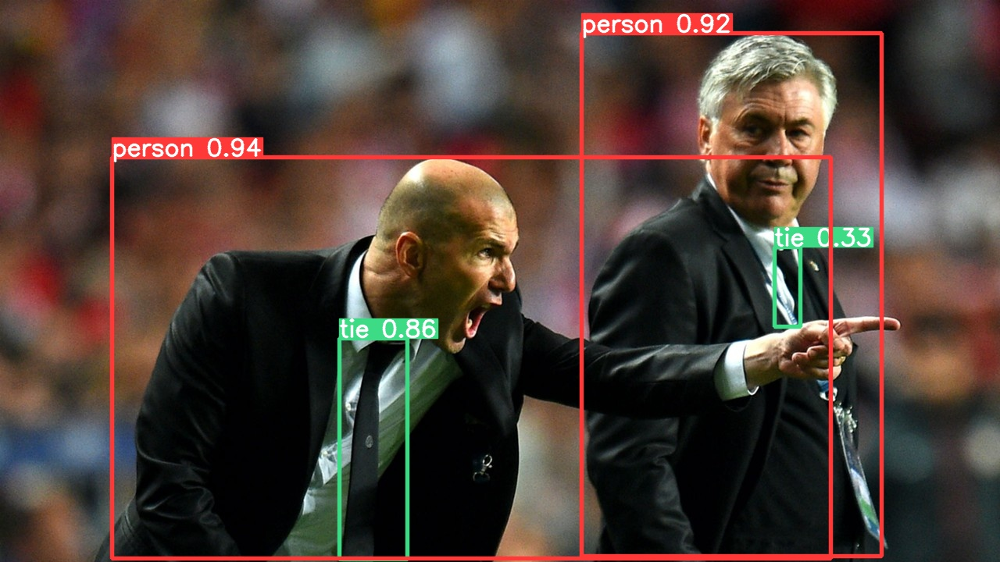

In [ ]:
Image(filename='runs/detect/exp/zidane.jpg',width=600)

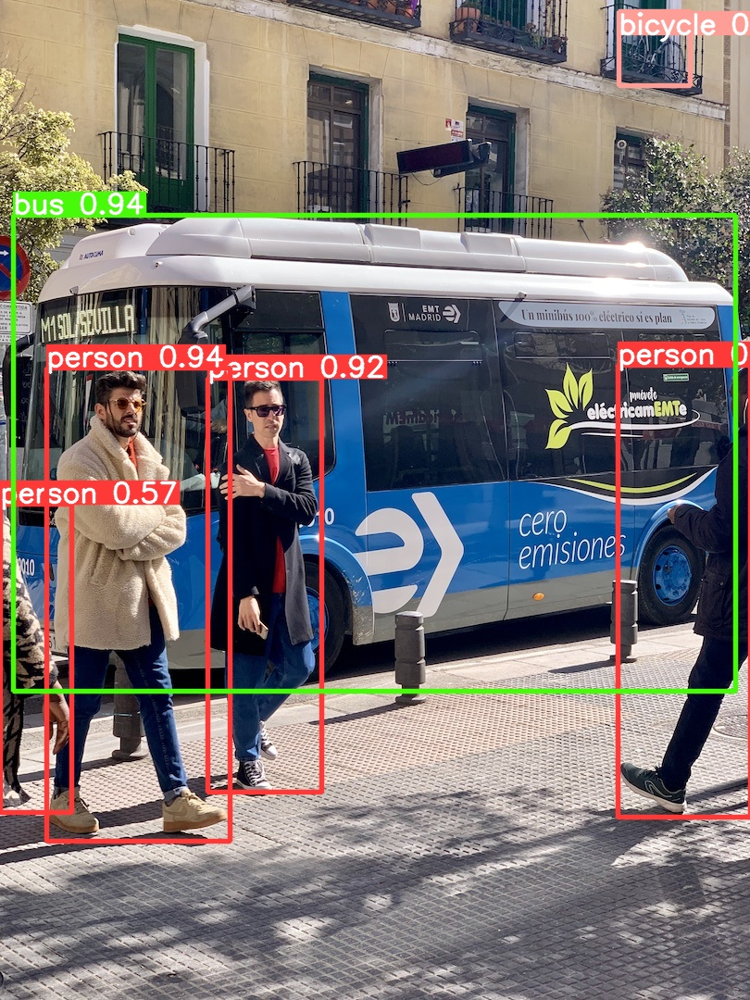

In [ ]:
Image(filename='runs/detect/exp/bus.jpg',width=600)

## YOLOv5

https://github.com/ultralytics/yolov5.git

In [ ]:
%cd /content
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -qr requirements.txt

import torch
from IPython.display import Image, clear_output

/content
Cloning into 'yolov5'...
remote: Enumerating objects: 14906, done.
remote: Total 14906 (delta 0), reused 0 (delta 0), pack-reused 14906
Receiving objects: 100% (14906/14906), 13.95 MiB | 18.45 MiB/s, done.
Resolving deltas: 100% (10246/10246), done.
/content/yolov5
     |████████████████████████████████| 184 kB 30.2 MB/s 
     |████████████████████████████████| 62 kB 1.5 MB/s 
     |████████████████████████████████| 1.6 MB 81.5 MB/s 


conf_thres

https://lynnshin.tistory.com/48

In [ ]:
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source data/images/  #yolov5s small 버전, conf : confidence threshold


detect: weights=['yolov5s.pt'], source=data/images/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-53-g65071da Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

100% 14.1M/14.1M [00:00<00:00, 385MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
image 1/2 /content/yolov5/data/images/bus.jpg: 640x480 4 persons, 1 bus, 14.3ms
image 2/2 /content/yolov5/data/images/zidane.jpg: 384x640 2 persons, 2 ties, 13.5ms
Speed: 0.5ms pre-process, 13.9ms inference, 1.2ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


In [ ]:
!pwd

/content/yolov5


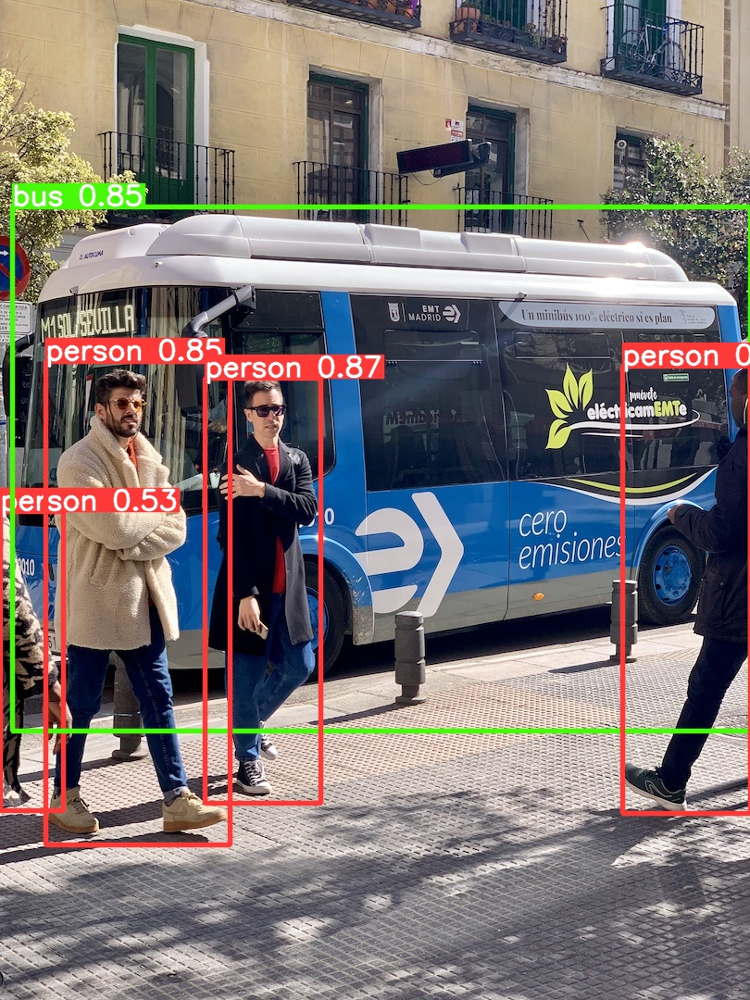

In [ ]:
Image(filename='runs/detect/exp/bus.jpg',width=600)

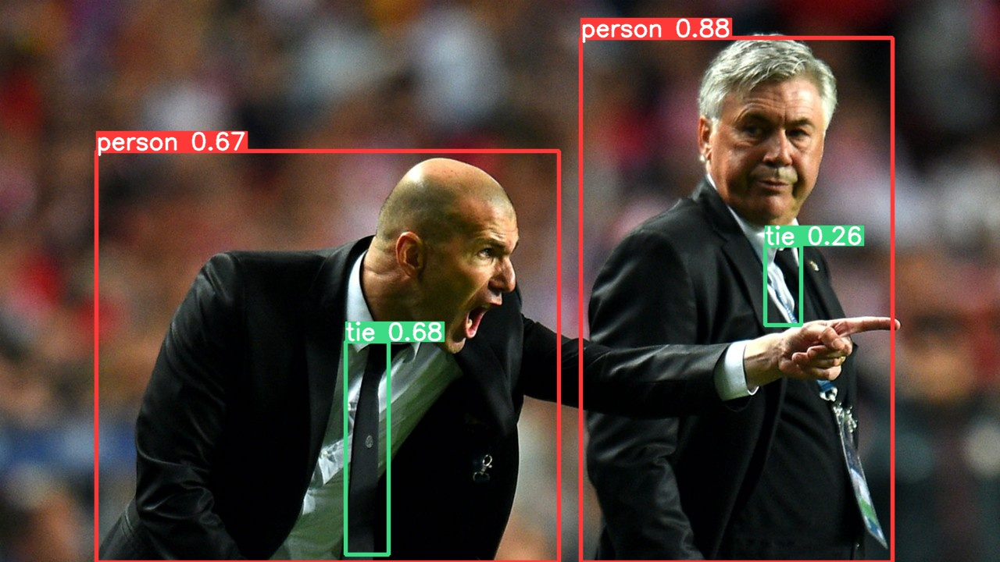

In [ ]:
Image(filename='runs/detect/exp/zidane.jpg',width=600)

## 특정 목적에 맞게 훈련하여 detecting

데이터셋 다운로드
- 포트홀 데이터셋 : https://public.roboflow.com/object-detection/pothole
- url copy : https://public.roboflow.com/ds/bYJNNdPId2?key=WsonnjVSrC



In [ ]:
%mkdir /content/yolov5/pothole
%cd /content/yolov5/pothole

/content/yolov5/pothole


In [ ]:
!pwd

/content/yolov5/pothole


In [ ]:
#  curl은 커맨드 아린용 데이터 전송 도구. -L 옵션을 사용하여 HTTP 위치 헤더를 따르기(리다이렉션을 따르도록 curl 을 사용할 수 있음)
!curl -L "https://public.roboflow.com/ds/bYJNNdPId2?key=WsonnjVSrC" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   901  100   901    0     0   1802      0 --:--:-- --:--:-- --:--:--  1802
100 46.0M  100 46.0M    0     0  10.0M      0  0:00:04  0:00:04 --:--:-- 11.9M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/img-105_jpg.rf.3fe9dff3d1631e79ecb480ff403bcb86.jpg  
 extracting: test/images/img-107_jpg.rf.2e40485785f6e5e2efec404301b235c2.jpg  
 extracting: test/images/img-146_jpg.rf.61be25b3053a51f622a244980545df2b.jpg  
 extracting: test/images/img-161_jpg.rf.211541e7178a4a93ec0680f26b905427.jpg  
 extracting: test/images/img-168_jpg.rf.af3590e07b06b43e91fa53990ff94af3.jpg  
 extracting: test/images/img-179_jpg.rf.8632eb0d9b75fefe144829e67b75015a.jpg  
 extracting: test/images/img

In [ ]:
!ls

data.yaml  README.dataset.txt  README.roboflow.txt  test  train  valid


In [ ]:
from glob import glob # glob 모듈의 glob 함수는 사용자가 제시한 조건에 맞는 파일명을 리스트 형식으로 반환

train_img_list = glob('/content/yolov5/pothole/train/images/*.jpg')
test_img_list= glob('/content/yolov5/pothole/test/images/*.jpg')
valid_img_list = glob('/content/yolov5/pothole/valid/images/*.jpg')
print(len(train_img_list), len(test_img_list),len(valid_img_list))


465 67 133


In [ ]:
len(train_img_list)

465

커스텀 매직 정의

https://ipython.readthedocs.io/en/stable/config/custommagics.html

YAML<br>
YAML은 구성 파일 작성에 자주 사용되는 데이터 직렬화 언어.
YAML의 가장 흔한 용도 중 하나는 구성 파일을 생성하는 것입니다. YAML과 JSON은 대부분의 경우 서로 바꿔서 사용할 수 있지만 YAML이 JSON보다 가독성이 높고 더 사용자 친화적이기 때문에 구성 파일은 JSON이 아닌 YAML로 작성하는 것이 좋습니다.  

In [ ]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic # decorator
def writetemplate(line,cell):
  with open(line,'w') as f:
    f.write(cell.format(**globals()))

In [ ]:
import yaml
%cat /content/yolov5/pothole/data.yaml

train: ../train/images
val: ../valid/images

nc: 1
names: ['pothole']

In [ ]:
%%writetemplate /content/yolov5/pothole/data.yaml
train: ./pothole/train/images
test: ./pothole/test/images
val: ./pothole/valid/images

nc: 1
names: ['pothole']

In [ ]:
%cat /content/yolov5/pothole/data.yaml

train: ./pothole/train/images
test: ./pothole/test/images
val: ./pothole/valid/images

nc: 1
names: ['pothole']


In [ ]:
# 모델 구성
import yaml
with open('/content/yolov5/pothole/data.yaml','r') as stream:
  num_classes = str(yaml.safe_load(stream)['nc'])

%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [ ]:
num_classes

'1'

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# Parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
%cat /content/yolov5/models/custom_yolov5s.yaml


# Parameters
nc: 1  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, Fa

학습(Training)
- img : 입력 이미지 크기 정의
- batch : 배치 크기 결정
- epochs : 학습 기간 개수 정의
- data : yaml 파일 경로
- cfg : 모델 구성 지정
- weights : 가중치에 대한 경로 지정
- name : 결과 이름
- nosave : 최종 체크포인트만 저장
- cache : 빠른 학습을 위한 이미지 캐시

In [ ]:
!pwd

/content/yolov5/pothole


In [ ]:
%%time
%cd /content/yolov5
!python train.py --img 640 --batch 32 --epochs 100 --data ./pothole/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name pothole_results --cache

/content/yolov5
train: weights=, cfg=./models/custom_yolov5s.yaml, data=./pothole/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=pothole_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-53-g65071da Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
!ls /content/yolov5/runs/train/pothole_results/

confusion_matrix.png				     results.png
events.out.tfevents.1672323534.b126f30c4519.51042.0  train_batch0.jpg
F1_curve.png					     train_batch1.jpg
hyp.yaml					     train_batch2.jpg
labels_correlogram.jpg				     val_batch0_labels.jpg
labels.jpg					     val_batch0_pred.jpg
opt.yaml					     val_batch1_labels.jpg
P_curve.png					     val_batch1_pred.jpg
PR_curve.png					     val_batch2_labels.jpg
R_curve.png					     val_batch2_pred.jpg
results.csv					     weights


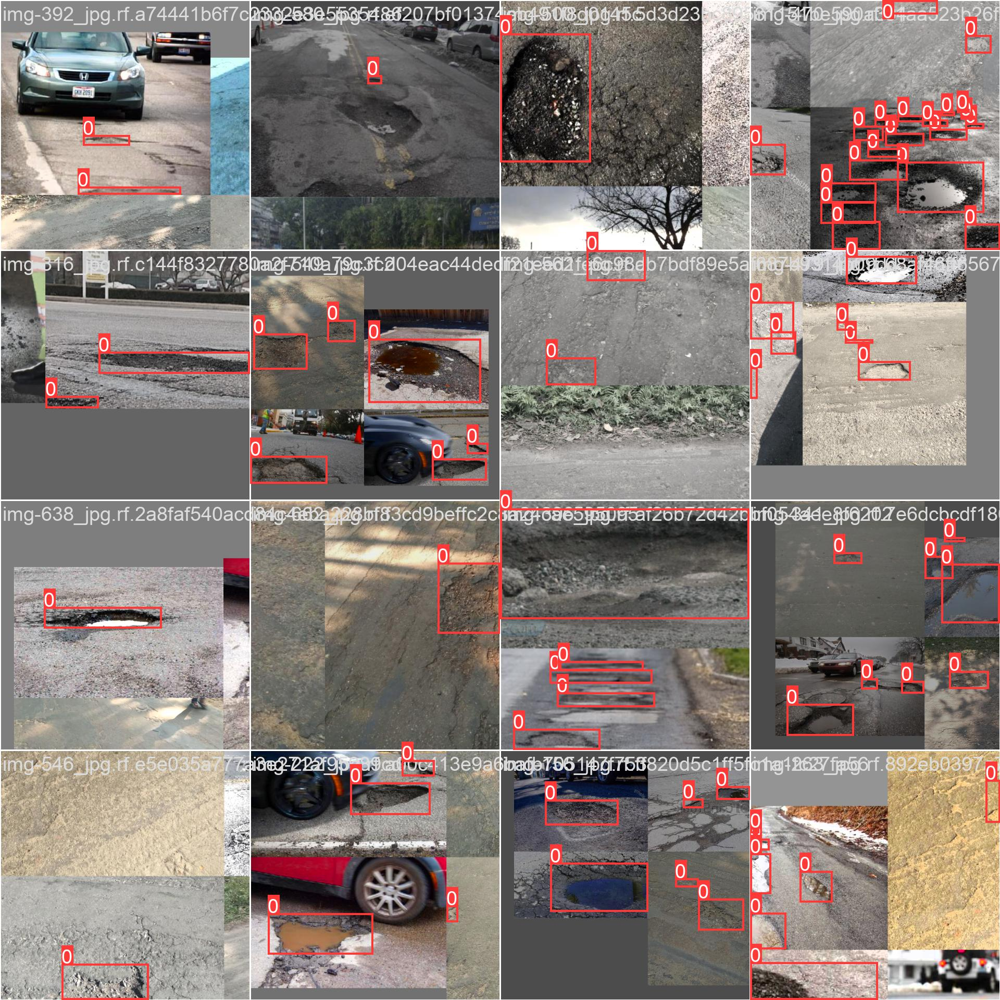

In [ ]:
Image(filename='/content/yolov5/runs/train/pothole_results/train_batch0.jpg',width=1000)

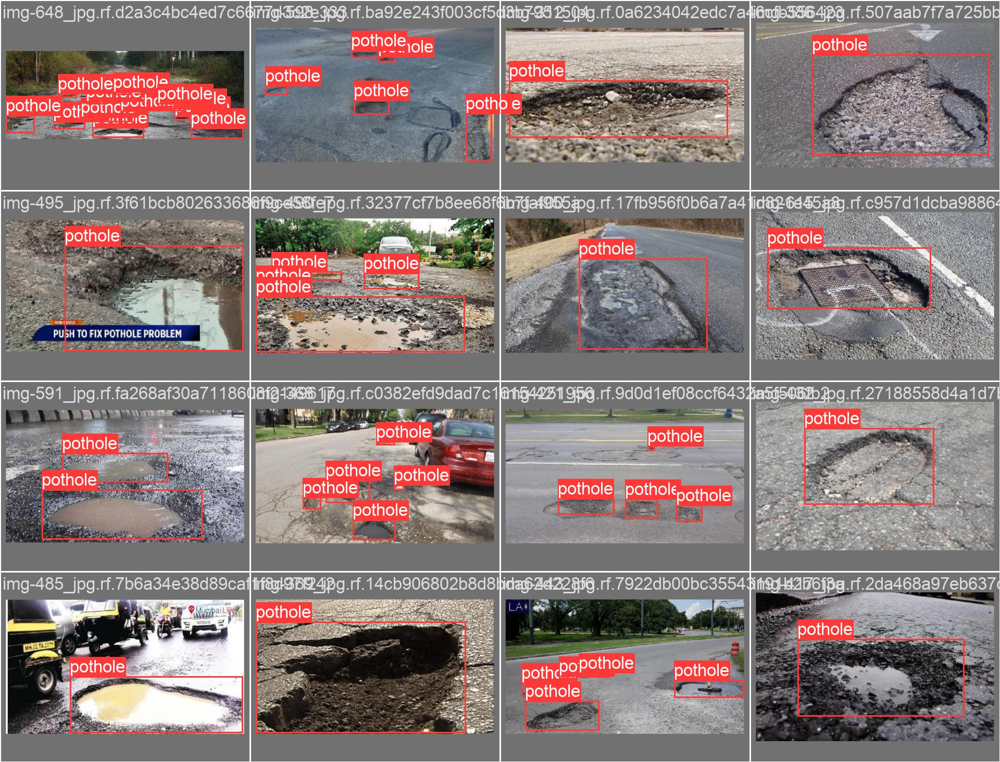

In [ ]:
Image(filename='/content/yolov5/runs/train/pothole_results/val_batch0_labels.jpg',width=1000)

In [ ]:
# 검증
!python val.py --weights runs/train/pothole_results/weights/best.pt --data ./pothole/data.yaml --img 640 --iou 0.65 

val: data=./pothole/data.yaml, weights=['runs/train/pothole_results/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.65, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-53-g65071da Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/yolov5/pothole/valid/labels.cache... 133 images, 0 backgrounds, 0 corrupt: 100% 133/133 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 5/5 [00:03<00:00,  1.50it/s]
                   all        133        330      0.671      0.591      0.663      0.347
Speed: 1.4ms pre-process, 7.9ms inference, 5.6ms NMS per image at shape (32, 3, 640, 640)
Results s

In [ ]:
# 검증
# half=True, # use FP16 half-precision inference : 더 적은 bit로 수를 표현할 때는 16bit을 사용하며, 이를 Half Precision이라 부릅니다.
!python val.py --weights runs/train/pothole_results/weights/best.pt --data ./pothole/data.yaml --img 640 --iou 0.65 --half

val: data=./pothole/data.yaml, weights=['runs/train/pothole_results/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.65, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v7.0-53-g65071da Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/yolov5/pothole/valid/labels.cache... 133 images, 0 backgrounds, 0 corrupt: 100% 133/133 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 5/5 [00:03<00:00,  1.50it/s]
                   all        133        330      0.671      0.591      0.662      0.349
Speed: 0.2ms pre-process, 5.0ms inference, 7.0ms NMS per image at shape (32, 3, 640, 640)
Results sa

In [ ]:
# --task 설정 안해주면 default롤 'val'이 적용된다.
!python val.py --weights runs/train/pothole_results/weights/best.pt --data ./pothole/data.yaml --img 640 --task test

val: data=./pothole/data.yaml, weights=['runs/train/pothole_results/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-53-g65071da Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
test: Scanning /content/yolov5/pothole/test/labels... 67 images, 0 backgrounds, 0 corrupt: 100% 67/67 [00:00<00:00, 2916.79it/s]
test: New cache created: /content/yolov5/pothole/test/labels.cache
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 3/3 [00:02<00:00,  1.35it/s]
                   all         67        154      0.744      0.624      0.671      0.378
Speed: 1.3ms pre-process, 7.9ms

In [ ]:

!python detect.py --weights runs/train/pothole_results/weights/best.pt --img 640 --conf 0.4 --source ./pothole/test/images

detect: weights=['runs/train/pothole_results/weights/best.pt'], source=./pothole/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-53-g65071da Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/67 /content/yolov5/pothole/test/images/img-105_jpg.rf.3fe9dff3d1631e79ecb480ff403bcb86.jpg: 640x640 1 pothole, 12.6ms
image 2/67 /content/yolov5/pothole/test/images/img-107_jpg.rf.2e40485785f6e5e2efec404301b235c2.jpg: 640x640 1 pothole, 12.6ms
image 3/67 /content/yolov5/pothole/test/images/img-146_jpg.rf.61be25b3053

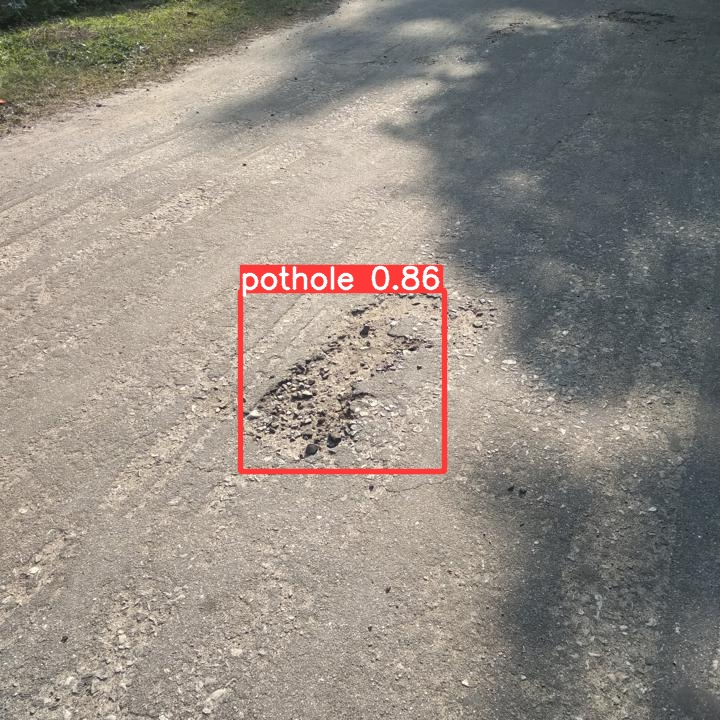

In [ ]:
import glob
import random
from IPython.display import Image, display

image_name = random.choice(glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'))
display(Image(filename=image_name))

In [ ]:
# 모델 내보내기
# %mkdir /content/drive/MyDrive/colab_lecture/강의/pothole
%cp /content/yolov5/runs/train/pothole_results/weights/best.pt /content/drive/MyDrive/colab_lecture/강의/pothole

동영상 detection
https://foss4g.tistory.com/1647

https://kyeonminsu.tistory.com/13

주차공간 데이터셋
https://public.roboflow.com/object-detection/pklot

연기 데이터셋 https://public.roboflow.com/object-detection/wildfire-smoke/